In [ ]:
from imutils.object_detection import non_max_suppression
import imutils
import os
import sys
import glob
import joblib
from google.colab.patches import cv2_imshow
import pickle
import itertools
import glob
import os.path
from PIL import Image
import numpy as np
import cv2

!pip install mean_average_precision

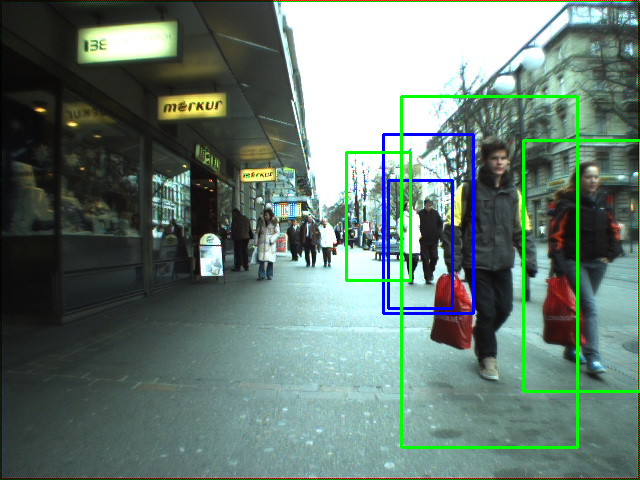

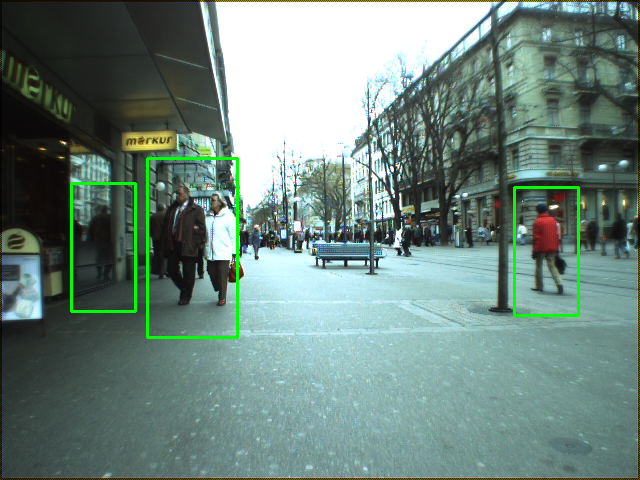

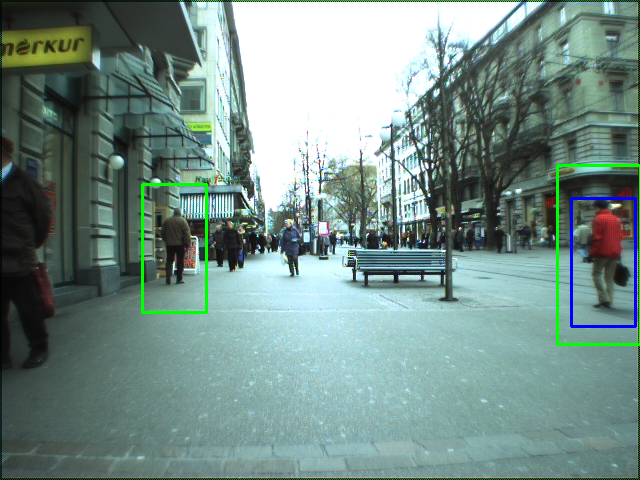

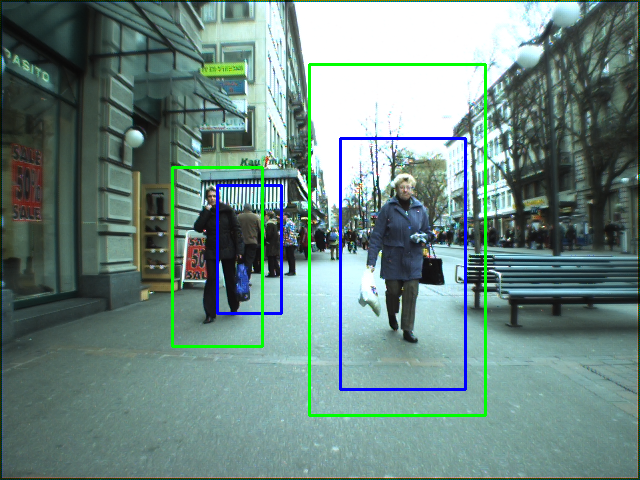

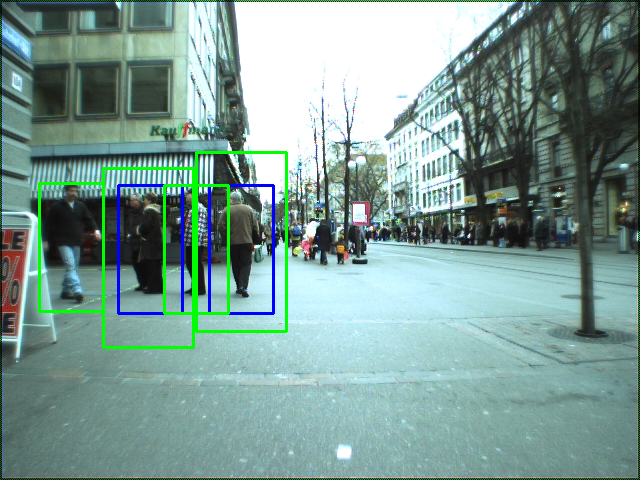

...

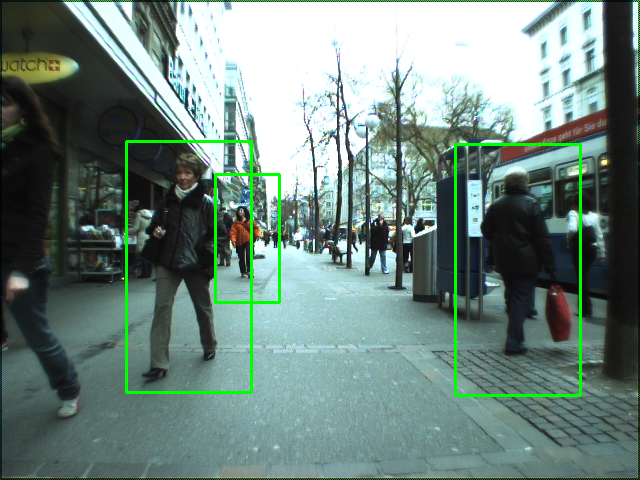

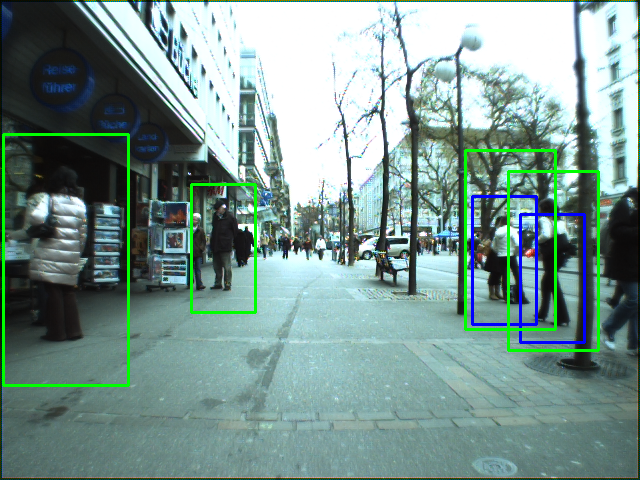

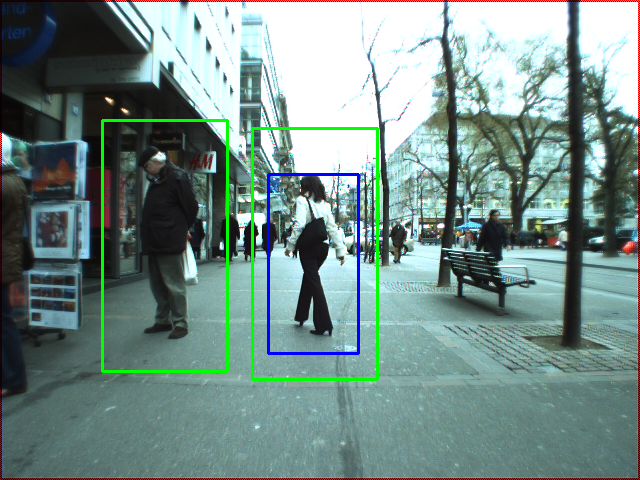

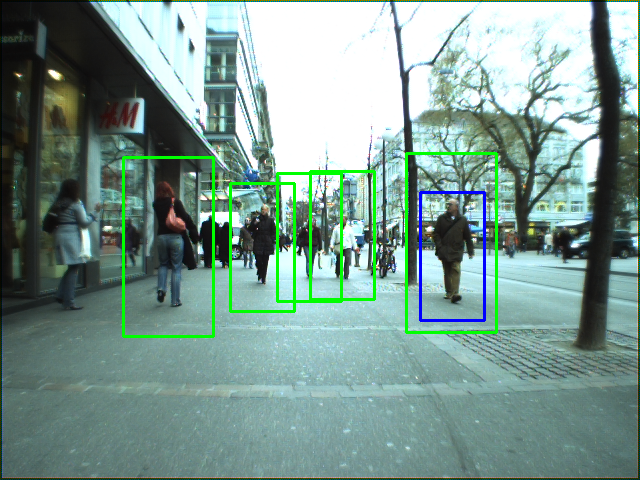

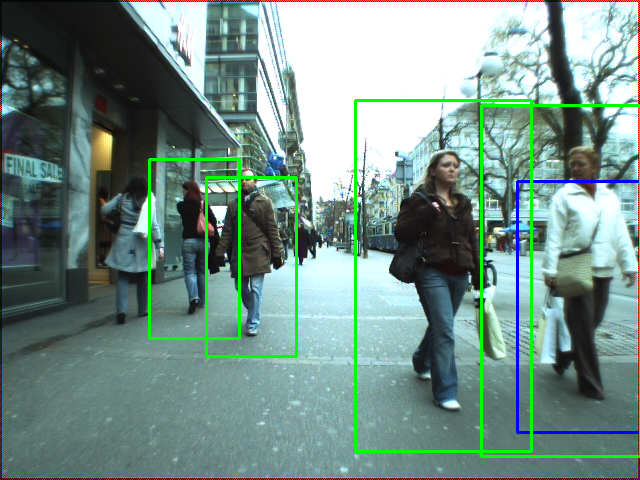

In [13]:
# opencv implementation
hog = cv2.HOGDescriptor("hog.xml")
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

rects_ = {}

for i in range(100,999,50):
  # Here put the address of the images
  image = cv2.imread("/content/drive/MyDrive/CV/seq03-img-left/image_00000"+str(i)+"_0.png")

  (rects, weights) = hog.detectMultiScale(image, winStride=(1, 1),padding=(8, 8), scale=1.4)

  # for (x, y, w, h) in rects:
  #     cv2.rectangle(image, (x, y),(x + w, y + h),(0, 0, 255), 2)
  
  prune_rects = []
  if(np.sum(weights>0.5)==0):
    weights = weights/np.linalg.norm(weights)
  for j in range(len(rects)):
    x,y,w,h = rects[j]
    if(weights[j]>0.5):
      prune_rects.append([x, y, w, h])


  for (x, y, w, h) in prune_rects:
    cv2.rectangle(image, (x, y),(x + w, y + h),(255, 0, 0), 2)

  rects = np.array([[x, y, x + w, y + h] for (x, y, w, h) in prune_rects])
  pick = non_max_suppression(rects, probs=None, overlapThresh=0.65)

  rects_[i] = []
  for (xA, yA, xB, yB) in pick:
    cv2.rectangle(image, (xA, yA), (xB, yB), (0, 255, 0), 2)
    rects_[i].append([xA,yA,xB,yB,0,1.0])

  # Output (Linear SVM)
  cv2_imshow(image)

**mAP Calculation**

In [ ]:
file1 = open("./bahnhof-annot.idl","r+") 
x = file1.read()
ann = {}
for it in x.split(";"):
    ind = it.split(":")[0].replace("\n","").strip("\"")
    ann[ind] = []
    for y in it.split(":")[-1].split("),"):
        y = y.strip().strip(".").strip("(").strip(")")
        li = []
        for yy in y.split(","):
            li.append(int(yy.strip()))
        ann[ind].append(li)
file1.close()

In [ ]:
from mean_average_precision import MetricBuilder

In [ ]:
i = 0
metric_fn = MetricBuilder.build_evaluation_metric("map_2d", async_mode=True, num_classes=1)
for key in rects_.keys():
  i += 1
  temp_l = []
  for bb in ann["left/image_00000"+str(key)+"_0.png"]:
    bb.append(0)
    bb.append(0)
    bb.append(0)
    temp_l.append(bb)
  gt = np.array(temp_l) 
  pred = np.array(rects_[key])
  # print(pred)

  metric_fn.add(pred, gt)
  # if(i==100):
  #   break;

In [11]:
metric_fn.value(iou_thresholds=0.50)['mAP']

0.023379713

**tSNE plot**

In [ ]:
import random

hog = cv2.HOGDescriptor("hog.xml")
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

def sliding_window(image, stepSize, windowSize=(64,128)):
  for y in range(0, image.shape[0]-windowSize[1], stepSize):
    for x in range(0, image.shape[1]-windowSize[0], stepSize):
      yield (x, y, image[y: y + windowSize[1], x:x + windowSize[0]])

rects_ = []

x = {}
y = {}
x[0] = []
x[1] = []
y[0] = []
y[1] = []

for i in range(100,999,5):
  # Here put the address of the images
  image = cv2.imread("/content/drive/MyDrive/CV/seq03-img-left/image_00000"+str(i)+"_0.png")

  for img_ in sliding_window(image, stepSize=10, windowSize=(64,128)):
    (rects, weights) = hog.detect(img_[-1])
    hog_ = hog.compute(img_[-1])
    if(len(rects)):
      x[1].append(hog_)
    else:
      x[0].append(hog_)
  print(i)

pos_samples = x[1]
neg_samples = random.sample(x[0],len(x[1]))

DATA = {}

for i in range(3781):
  DATA[i] = []

for i in pos_samples:
  for index in range(len(i)):
    DATA[index].append(i[index][0])
  DATA[3780].append(1)
for i in neg_samples:
  for index in range(len(i)):
    DATA[index].append(i[index][0])
  DATA[3780].append(0)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


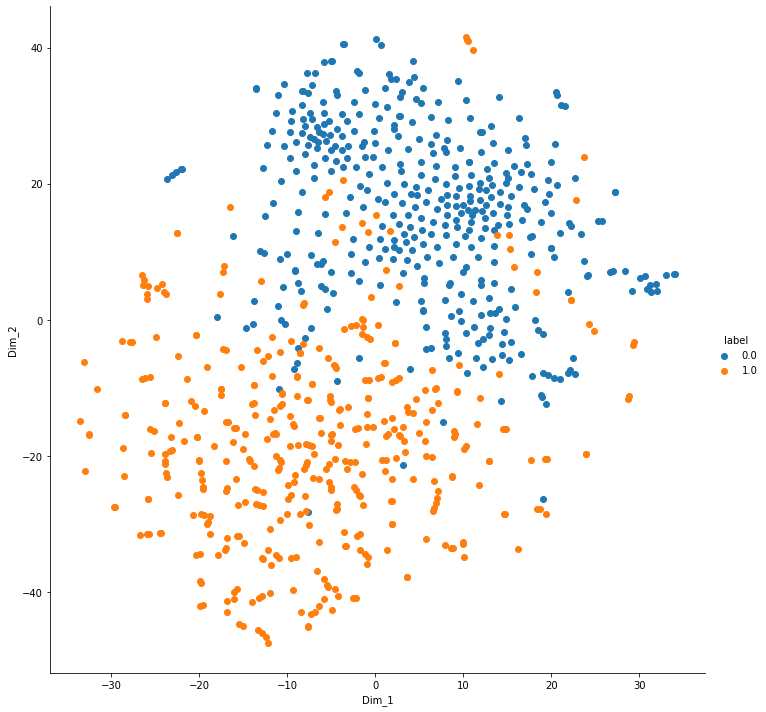

In [ ]:
from sklearn.manifold import TSNE
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

data = pd.DataFrame(DATA)

model = TSNE(n_components = 2, random_state = 0)
tsne_data = model.fit_transform(data.drop(3780,axis=1))

tsne_data = np.vstack((tsne_data.T, data[3780])).T
tsne_df = pd.DataFrame(data = tsne_data,columns =("Dim_1", "Dim_2", "label"))

sns.FacetGrid(tsne_df, hue ="label", size = 10).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
 
plt.show()